In [1]:
import importlib
from gal_goku import plot
importlib.reload(plot)
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
train_subdir = 'train_combined_additive'

plot_xi_emu = plot.PlotXiEmu(data_dir=data_dir, train_subdir=train_subdir, use_rho=False)

2025-08-15 09:47:39.320563: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-15 09:47:39.323944: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-08-15 09:47:39.333900: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755269259.350326 1268625 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755269259.355193 1268625 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1755269259.368453 1268625 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

Using 10 cores for parallel processing


2025-08-15 09:47:42.922053: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-08-15 09:47:43.058640: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-08-15 09:47:43.202279: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-08-15 09:47:43.340883: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-08-15 09:47:43.504075: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-08-15 09:47:43.808012: E external/local_xla/xla/stream_executor/cuda/cuda_platfo

In [2]:
plot_xi_emu.truth.shape

(36, 14, 14, 26)

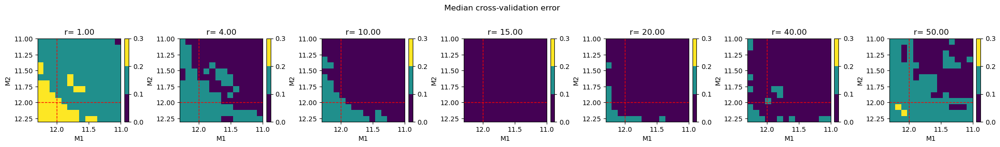

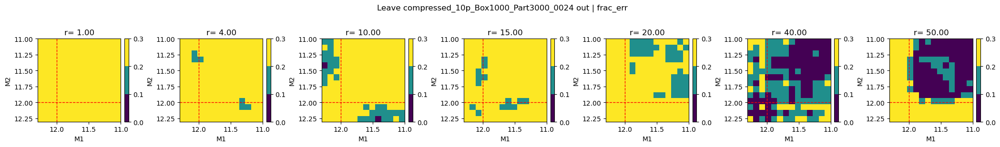

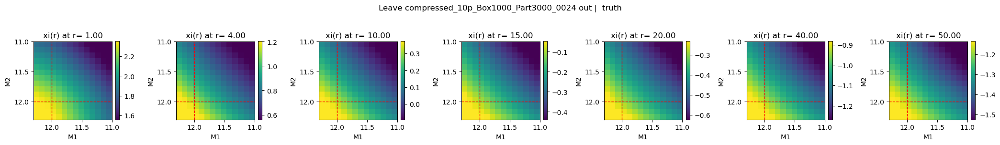

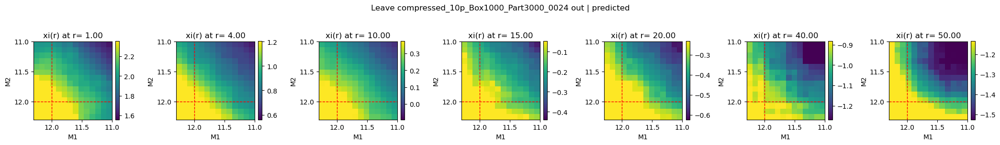

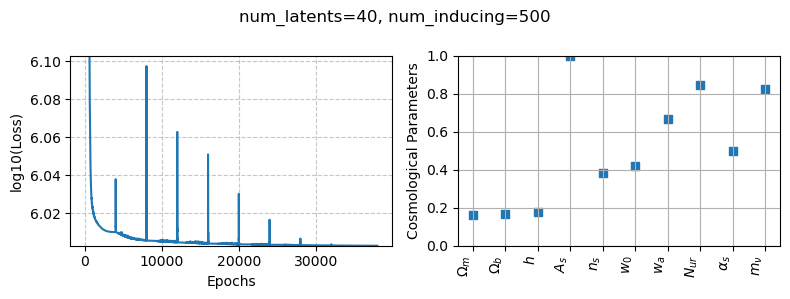

...

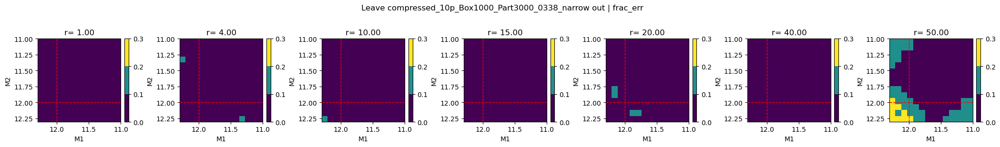

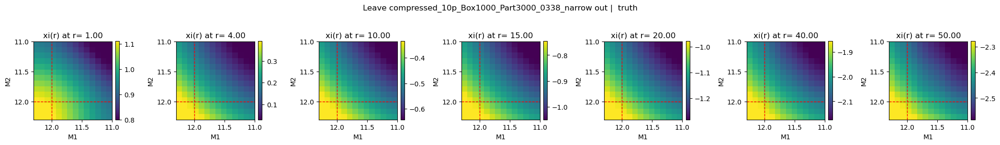

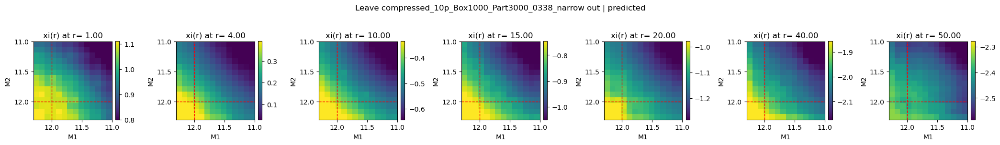

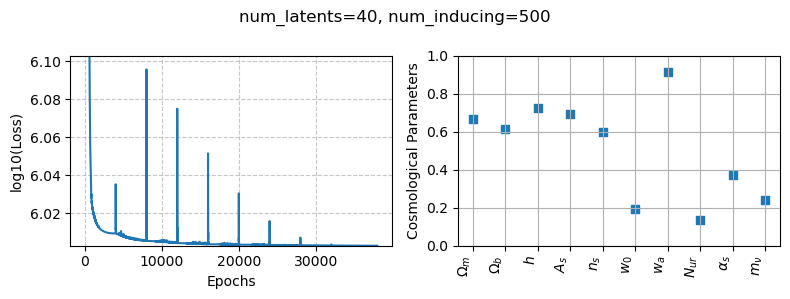

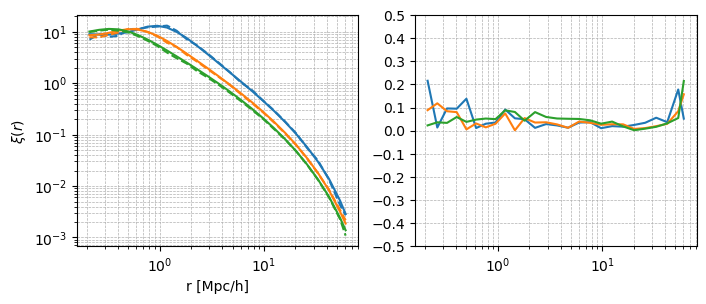

In [3]:
plot_xi_emu.cross_valid_2d_errs(mass_range=(12.3, 11))

In [5]:
# params of interest
import numpy as np
indp = [0, 2, 3, 4]
dist = np.abs(plot_xi_emu.dist_planck)
print(dist.shape)
ind_sims = np.arange(dist.shape[0])
outlier_sims = []
for p in indp:
    percent = np.percentile(dist[:,p], [80])
    ind_above = np.where(dist[:,p] >= percent[0])
    print(f"Parameter {list(plot_xi_emu.latex_labels.keys())[p]}: {len(ind_above[0])} simulations above 80th percentile of {percent}, sims= {ind_above}")
    print(dist[ind_above, p])
    outlier_sims.extend(ind_above)
outlier_sims = np.unique(np.array(outlier_sims))
remaining_sims = np.setdiff1d(ind_sims, outlier_sims)
print(f"Total number of outlier simulations: {len(outlier_sims)}")


(36, 10)
Parameter omega0: 8 simulations above 80th percentile of [11.06071429], sims= (array([ 0,  5,  6, 11, 14, 17, 18, 20]),)
[[11.06071429 12.125      14.275      12.89642857 14.31071429 12.16785714
  15.94642857 11.69642857]]
Parameter hubble: 8 simulations above 80th percentile of [12.62563323], sims= (array([ 5,  7, 10, 16, 18, 19, 29, 32]),)
[[13.53968254 17.75555556 13.69206349 16.02857143 14.35238095 16.12380952
  14.22982101 12.62563323]]
Parameter scalar_amp: 8 simulations above 80th percentile of [18.12222222], sims= (array([ 0,  1,  5,  9, 10, 12, 16, 20]),)
[[29.52222222 35.01111111 18.94444444 28.36666667 18.12222222 25.5
  21.94444444 24.25555556]]
Parameter ns: 8 simulations above 80th percentile of [26.13157895], sims= (array([ 1,  2,  3,  6,  7, 13, 15, 20]),)
[[28.97368421 43.55263158 28.23684211 34.81578947 26.13157895 29.55263158
  42.60526316 36.18421053]]
Total number of outlier simulations: 21


(36, 26)
(36, 26)


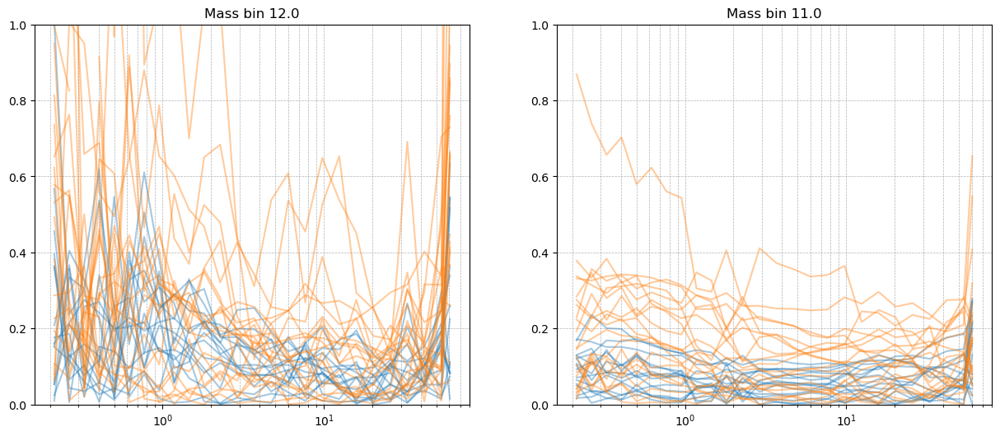

In [6]:
import matplotlib.pyplot as plt
import numpy as np


fig, ax = plt.subplots(1, 2, figsize=(15, 6))
mass_bins = np.unique(plot_xi_emu.emu.mbins[:,0])[::-1]

for i, indm in enumerate([3, 13]):
    frac_errs = plot_xi_emu.frac_errs[:,indm, indm,:]
    print(frac_errs.shape)

    for s in remaining_sims:
        ax[i].plot(plot_xi_emu.rbins, frac_errs[s,:], color='C0', alpha=0.4)
        #ax[i].plot(plot_xi_emu.rbins, np.nanmedian(frac_errs[remaining_sims,:], axis=0), color='C0')
    for s in outlier_sims:
        ax[i].plot(plot_xi_emu.rbins, frac_errs[s,:], color='C1', alpha=0.4)
        #ax[i].plot(plot_xi_emu.rbins, np.nanmedian(frac_errs[outlier_sims,:], axis=0), color='C1')
    ax[i].set_title(f'Mass bin {mass_bins[indm]}')
    ax[i].set_xscale('log')
    ax[i].grid(which='both', linestyle='--', linewidth=0.5)
    ax[i].set_ylim(0, 1)


(36, 26)
(36, 26)


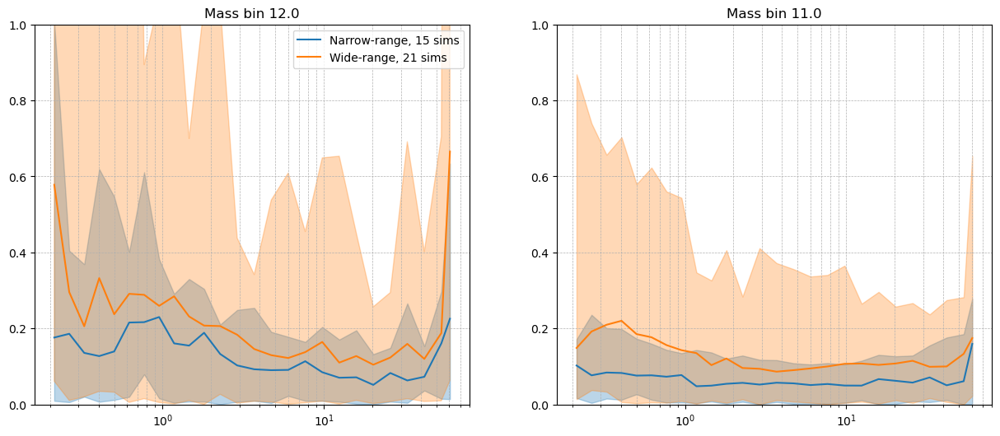

In [7]:
import matplotlib.pyplot as plt
import numpy as np


fig, ax = plt.subplots(1, 2, figsize=(15, 6))
mass_bins = np.unique(plot_xi_emu.emu.mbins[:,0])[::-1]

for i, indm in enumerate([3, 13]):
    frac_errs = plot_xi_emu.frac_errs[:,indm, indm,:]
    print(frac_errs.shape)

    #for s in remaining_sims:
    ax[i].plot(plot_xi_emu.rbins, np.nanmedian(frac_errs[remaining_sims,:], axis=0), color=f'C0', alpha=1, label=f'Narrow-range, {len(remaining_sims)} sims')
    ax[i].fill_between(plot_xi_emu.rbins, np.nanmin(frac_errs[remaining_sims,:], axis=0), np.nanmax(frac_errs[remaining_sims,:], axis=0), color=f'C0', alpha=0.3)

    #for s in outlier_sims:
    ax[i].plot(plot_xi_emu.rbins, np.nanmedian(frac_errs[outlier_sims,:], axis=0), color='C1', alpha=1, label=f'Wide-range, {len(outlier_sims)} sims')
    ax[i].fill_between(plot_xi_emu.rbins, np.nanmin(frac_errs[outlier_sims,:], axis=0), np.nanmax(frac_errs[outlier_sims,:], axis=0), color='C1', alpha=0.3)

    ax[i].set_title(f'Mass bin {mass_bins[indm]}')
    ax[i].set_xscale('log')
    ax[i].grid(which='both', linestyle='--', linewidth=0.5)
    ax[i].set_ylim(0, 1)
    ax[0].legend()
